In [1]:
# ! pip install -r ../requirements-dev.txt -q

In [2]:
import pandas as pd
import plotly.express as px
import numpy as np
from pathlib import Path
import h3
from math import radians, cos, sin, asin, sqrt, degrees, atan2
import shapely
import geopandas as gpd

## Собираем табличку с трейн данными

In [9]:
data_dir = Path("..","data")

In [10]:
transactions_df = pd.read_parquet(data_dir / "transactions.parquet").drop_duplicates()
# Заполняем std = 0 где одна транзакция
transactions_df['std'].fillna(0, inplace=True)

In [11]:
transactions_df.head()

,h3_09,customer_id,datetime_id,count,sum,avg,min,max,std,count_distinct,mcc_code
0,8911aa4c62fffff,1,3,1,3346.65,3346.650,3346.65,3346.65,0.000000,1,13
1,8911aa7b5b3ffff,4,3,1,450.00,450.000,450.00,450.00,0.000000,1,8
2,8911aa63623ffff,5,3,10,11035.69,1103.569,59.00,3620.18,1190.530333,6,13
3,8911aa48577ffff,9,2,2,628.00,314.000,295.00,333.00,26.870058,2,5
4,8911aa78297ffff,11,2,1,4155.00,4155.000,4155.00,4155.00,0.000000,1,10


In [12]:
target_df = pd.read_parquet(data_dir / "target.parquet").drop_duplicates()
target_df.head()

,h3_09,customer_id
0,8911aa6ac3bffff,23172
1,8911aa7a857ffff,95640
2,8911aa70b97ffff,60350
3,8911aa70b97ffff,69521
4,891181b69abffff,29437


In [13]:
# Собираем список всех доступных Hexes
# список всех 1658 геолокаций, где возможно снятие наличности, нужно разметить эти локации в решении
# Есть 3 локации, по которым нет транзакций set(hexses_target).difference(transactions_df.h3_09)
with open(data_dir / "hexses_target.lst", "r") as file:
    file_contents = file.read()
hexses_target = file_contents[:-1].split("\n") # remove /n
assert set(hexses_target)==set(target_df.h3_09)

# Cписок всех уникальных h3_09 из transactions_df (их всего 8154)
with open(data_dir / "hexses_data.lst", "r") as file:
    file_contents = file.read()
hexses_data = file_contents[:-1].split("\n")

all_hexses = list(set(hexses_target) | set(hexses_data))
# all_hexses = pd.DataFrame({"h3_09":all_hexses})
all_hexses = gpd.GeoDataFrame({"h3_09":all_hexses})
all_hexses["geometry"] = all_hexses["h3_09"].apply(lambda x: shapely.geometry.Polygon(h3.h3_to_geo_boundary(x, geo_json=True)))
all_hexses[['lat', 'lon']] = all_hexses['h3_09'].apply(lambda x: pd.Series(h3.h3_to_geo(x)))


/var/folders/m0/f3qckg9j7pl8__bdcw72_c700000gp/T/ipykernel_89258/653550747.py:17: FutureWarning: You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide geometry to the GeoDataFrame constructor (GeoDataFrame(... geometry=GeoSeries()) or use `set_geometry('geometry')` to explicitly set the active geometry column.
  all_hexses["geometry"] = all_hexses["h3_09"].apply(lambda x: shapely.geometry.Polygon(h3.h3_to_geo_boundary(x, geo_json=True)))


In [24]:
transactions_df = pd.merge(transactions_df, all_hexses, on="h3_09")
target_df = pd.merge(target_df, all_hexses, on="h3_09")

## Посмотрим на выбранного клиента

In [19]:
customer_id = 14235

In [ ]:
target_df[target_df["customer_id"]==customer_id]

In [ ]:
transactions_df[transactions_df["customer_id"]==customer_id]

In [ ]:
# transactions_df.customer_id.value_counts()

In [78]:
# See https://towardsdatascience.com/constructing-hexagon-maps-with-h3-and-plotly-a-comprehensive-tutorial-8f37a91573bb

def plot_customer_activity(all_hexses: pd.DataFrame, transactions_df: pd.DataFrame, target_df: pd.DataFrame, customer_id: int = None) -> None:
    """Plots map of transactions and cash withdraw of particular client or all clients"""
    transactions_df_plot = transactions_df.copy()
    target_df_plot = target_df.copy()

    if customer_id:
        transactions_df_plot = transactions_df_plot.query('customer_id == @customer_id')
        target_df_plot = target_df_plot.query('customer_id == @customer_id')

    # Добавим разброс, чтобы все было видно на карте
    transactions_df_plot['lat'] += np.random.normal(0, 0.0003, len(transactions_df_plot))
    transactions_df_plot['lon'] += np.random.normal(0, 0.0003, len(transactions_df_plot))

    fig = px.choropleth_mapbox(
        all_hexses,
        geojson=all_hexses.geometry,
        locations=all_hexses.index,  # Use index as locations to avoid duplicate rows
        center={"lat": 55.7558, "lon": 37.6173},  # Adjust the center as needed
        mapbox_style="open-street-map",
        opacity=0.2,
        height=800,
        zoom=10
    )

    data = px.scatter_mapbox(transactions_df_plot, lat='lat', lon='lon', color_discrete_sequence=['blue'],
                            hover_data=["datetime_id"]).data
    for trace in data:
        fig.add_trace(trace)

    data = px.scatter_mapbox(target_df_plot, lat='lat', lon='lon', color_discrete_sequence=['red']).data
    for trace in data:
        fig.add_trace(trace)
    fig.show()

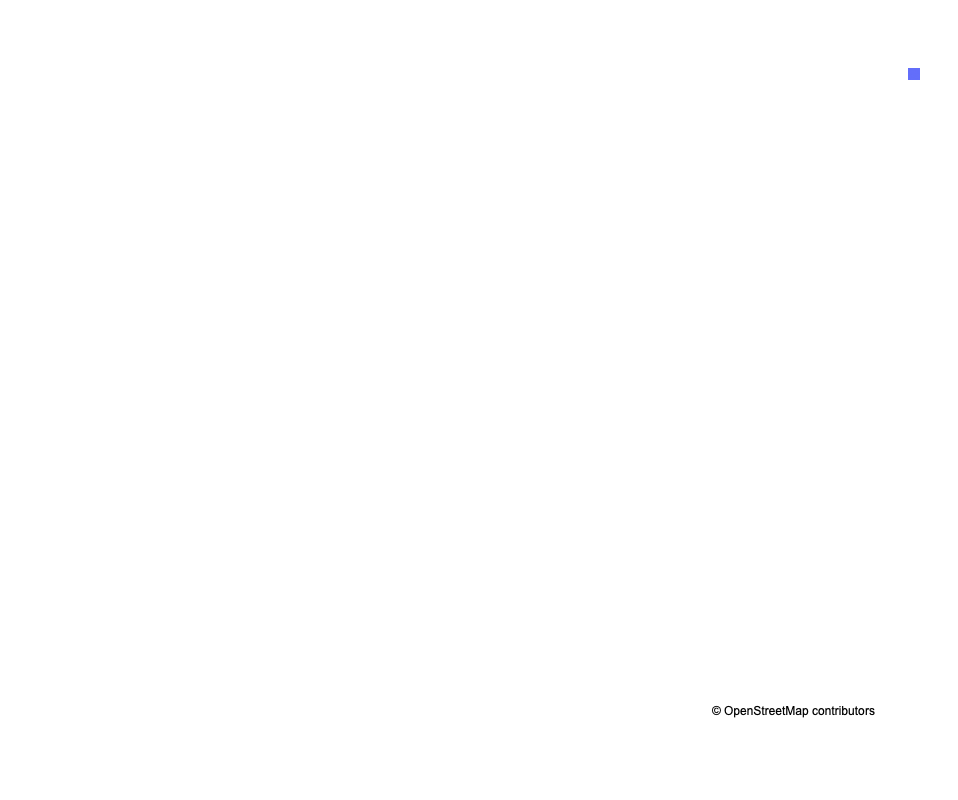

In [79]:
plot_customer_activity(all_hexses, transactions_df, target_df, customer_id)

## Еще файлы

In [ ]:
moscow_df = pd.read_parquet(data_dir / "moscow.parquet")

In [ ]:
moscow_df.head()

In [ ]:
for tag in moscow_df[~moscow_df.tags.isna()].tags.iloc[:20]:
    print(tag)

In [ ]:
fig = px.scatter_mapbox(moscow_df.iloc[:10000], lat='lat', lon='lon', hover_name='id', zoom=10, hover_data=["tags"])
fig.update_layout(mapbox_style="open-street-map", height=1000)
fig.update_layout(title='Plot of Points', hovermode='closest')
fig.show()

## Мусор

In [ ]:
def get_hexagon_grid(latitude, longitude, resolution, ring_size):
    """
    Generate a hexagonal grid GeoDataFrame centered around a specified location.
    Parameters:
    - latitude (float): Latitude of the center point.
    - longitude (float): Longitude of the center point.
    - resolution (int): H3 resolution for hexagons.
    - ring_size (int): Number of rings to create around the center hexagon.
    Returns:
    - hexagon_df (geopandas.GeoDataFrame): GeoDataFrame containing hexagons and their geometries.
    """

    # Get the H3 hexagons covering the specified location
    center_h3 = h3.geo_to_h3(latitude, longitude, resolution)
    hexagons = list(h3.k_ring(center_h3, ring_size))  # Convert the set to a list

    # Create a GeoDataFrame with hexagons and their corresponding geometries
    hexagon_geometries = [shapely.geometry.Polygon(h3.h3_to_geo_boundary(hexagon, geo_json=True)) for hexagon in hexagons]
    hexagon_df = gpd.GeoDataFrame({'Hexagon_ID': hexagons, 'geometry': hexagon_geometries})

    return hexagon_df

def calculate_hexagon_ids(df, hexagon_df):
    """
    Calculate Hexagon IDs for each hotel in a DataFrame based on their geographic coordinates.
    Args:
        df (pd.DataFrame): DataFrame containing hotel data with "Latitude" and "Longitude" columns.
        hexagon_df (gpd.GeoDataFrame): GeoDataFrame with hexagon geometries and associated Hexagon IDs.
    Returns:
        pd.DataFrame: The input DataFrame with an additional "Hexagon_ID" column indicating the Hexagon ID for each hotel.
    """

    # Create a column Hexagon_ID with the ID of the hexagon
    df['Hexagon_ID'] = None

    # Iterate through the hotels in the df DataFrame and calculate hotel counts within each hexagon
    for i, hotel in df.iterrows():
        point = shapely.geometry.Point(hotel["Longitude"], hotel["Latitude"])  # Latitude and Longitude switched
        for _, row in hexagon_df.iterrows():
            if point.within(row['geometry']):
                df.loc[i, 'Hexagon_ID'] = row['Hexagon_ID']
    
    return df

def create_choropleth_map(geojson_df, data_df, alpha=0.4, map_style="carto-positron", color_scale="Viridis"):
    """
    Create an interactive choropleth map using Plotly Express.
    Parameters:
    - geojson_df (GeoDataFrame): GeoJSON data containing polygon geometries.
    - data_df (DataFrame): DataFrame containing data to be visualized on the map.
    - alpha (float): Opacity level for the map polygons (0.0 to 1.0).
    - map_style (str): Map style for the Plotly map (e.g., "carto-positron").
    - color_scale (str): Color scale for the choropleth map.
    Returns:
    None
    """
    # Merge the GeoJSON data with your DataFrame
    merged_df = geojson_df.merge(data_df, on="Hexagon_ID", how="left")

    # Create a choropleth map using px.choropleth_mapbox
    fig = px.choropleth_mapbox(
        merged_df,
        geojson=merged_df.geometry,
        locations=merged_df.index,  # Use index as locations to avoid duplicate rows
        color="Count",
        color_continuous_scale=color_scale,
        title="Hotel Distribution Heatmap in Barcelona City",
        mapbox_style=map_style,
        center={"lat": 41.395, "lon": 2.18},  # Adjust the center as needed
        zoom=11.5,
    )

    # Customize the opacity of the hexagons
    fig.update_traces(marker=dict(opacity=alpha))

    # Add hover data for hotel names
    fig.update_traces(customdata=merged_df["Hotels"])

    # Define the hover template 
    hover_template = "<b>Hotels:</b> %{customdata}<extra></extra>"
    fig.update_traces(hovertemplate=hover_template)

    # Set margins to 25 on all sides
    fig.update_layout(margin=dict(l=35, r=35, t=45, b=35))
    
    # Adjust the width of the visualization
    fig.update_layout(width=1000) 

    fig.show()

# # Read the CSV file into a Pandas DataFrame
# file_path = 'opendatabcn_allotjament_hotels-csv.csv'  
# df = pd.read_csv(data_dir / file_path, encoding = 'utf-16')

# # Define a list of column names to select
# selected_column_names = ['name', 'addresses_neighborhood_name', 'addresses_district_name', 'geo_epgs_4326_lat', 'geo_epgs_4326_lon']

# # Select the specified columns from the DataFrame
# df = df[selected_column_names]

# # Define a dictionary to map the old column names to the new names
# column_name_mapping = {
#     'name': 'Name',
#     'addresses_neighborhood_name': 'Neighborhood',
#     'addresses_district_name': 'District',
#     'geo_epgs_4326_lat': 'Latitude',
#     'geo_epgs_4326_lon': 'Longitude'
# }

# # Use the rename method to rename the columns
# df.rename(columns=column_name_mapping, inplace=True)

# # Extract the name of the hotel
# df['Name'] = df['Name'].str.split(' - ').str[0]

# # Display the first few rows of the DataFrame
# df.head()


# # Latitude and longitude coordinates for the center of Barcelona
# barcelona_lat = 41.3851
# barcelona_lng = 2.1734

# # Generate H3 hexagons at a specified resolution (e.g., 9)
# resolution = 9

# # Indicate the number of rings around the central hexagon
# ring_size = 45

# # Hexagon grid around barcelona
# hexagon_df = get_hexagon_grid(barcelona_lat, barcelona_lng, resolution, ring_size)

# # Visualize the first rows of the GeoDataFrame
# hexagon_df.head()

# # Use the function to calculate the hexagon_ids
# df = calculate_hexagon_ids(df, hexagon_df)

# # Visualize the first rows of the DataFrame
# df.head()


# Group by Hexagon_ID and perform the operations
grouped_df = df.groupby('Hexagon_ID').agg({
    'Name': ['count', '<br>'.join]
}).reset_index()

# Rename columns for clarity
grouped_df.columns = ['Hexagon_ID', 'Count', 'Hotels']

# Visualize the first rows of the DataFrame
grouped_df.head()

# Call the function with your GeoJSON and DataFrame
create_choropleth_map(geojson_df=hexagon_df, data_df=grouped_df)